In [1]:
from pyspark.sql import SparkSession

In [2]:
import pandas as pd

In [16]:
from pyspark.sql.functions import col
import plotly.graph_objects as go
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType,StructType,StructField, FloatType

In [4]:
spark = SparkSession.builder \
    .appName("Book Analysis") \
    .getOrCreate()

24/04/22 09:14:54 WARN Utils: Your hostname, tanmay-Inspiron-15-7000-Gaming resolves to a loopback address: 127.0.1.1; using 192.168.29.206 instead (on interface wlp3s0)
24/04/22 09:14:54 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/04/22 09:14:54 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [5]:
df = spark.read.option("header", "true").option("delimiter", ",").option("quote", "\"").option("escape", "\"").csv("books_task.csv")

In [6]:
df.printSchema()

root
 |-- _c0: string (nullable = true)
 |-- Title: string (nullable = true)
 |-- description: string (nullable = true)
 |-- authors: string (nullable = true)
 |-- publisher: string (nullable = true)
 |-- publishedDate: string (nullable = true)
 |-- categories: string (nullable = true)
 |-- Impact: string (nullable = true)



In [7]:
df.select('categories').distinct().show()

+--------------------+
|          categories|
+--------------------+
|         ['Cooking']|
|['Sports & Recrea...|
|['Young Adult Fic...|
|['Business & Econ...|
|          ['Bibles']|
|       ['Libraries']|
| ['Conduct of life']|
|          ['Canada']|
|         ['Medical']|
|['Brothers and si...|
|['American fiction']|
|           ['Music']|
|['Crafts & Hobbies']|
|      ['Philosophy']|
|            ['Jews']|
|['Electronic books']|
|          ['Travel']|
|      ['Study Aids']|
|     ['Mathematics']|
|['Family & Relati...|
+--------------------+
only showing top 20 rows



## EDA

### Impact

In [14]:
df.count()

138724

In [17]:
numeric_check_df = df.filter(col("Impact").cast("float").isNotNull())

In [19]:
numeric_check_df.count()

138724

In [22]:
df = df.withColumn("impact_float", col("Impact").cast("float"))

In [23]:
histogram_data = df.select("impact_float").rdd.flatMap(lambda x: x).histogram(10)

In [24]:
print("Histogram:")
for i in range(len(histogram_data[0]) - 1):
    print("[{}, {}) : {}".format(histogram_data[0][i], histogram_data[0][i+1], histogram_data[1][i]))

Histogram:
[0.0, 100.0) : 3
[100.0, 200.0) : 12
[200.0, 300.0) : 51
[300.0, 400.0) : 162
[400.0, 500.0) : 525
[500.0, 600.0) : 1725
[600.0, 700.0) : 8132
[700.0, 800.0) : 56794
[800.0, 900.0) : 69329
[900.0, 1000.0) : 1991


In [34]:
temp = df.select("impact_float").toPandas()

array([[<Axes: title={'center': 'impact_float'}>]], dtype=object)

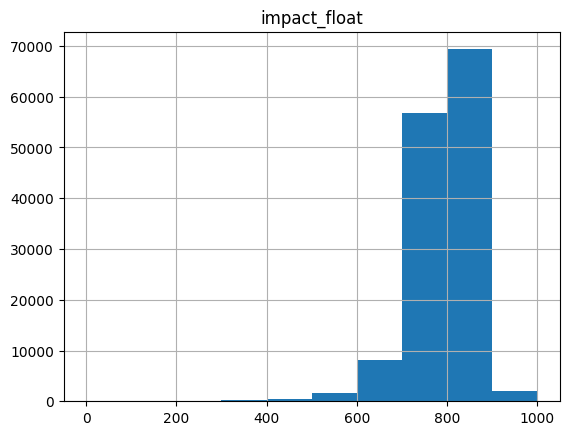

In [39]:
temp.hist()

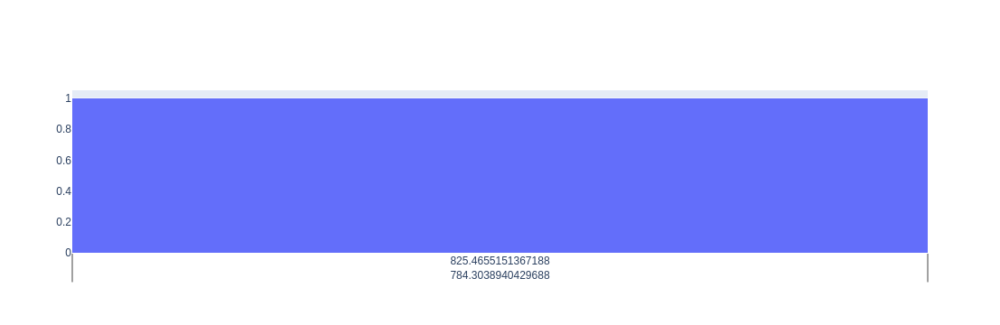

In [42]:
fig = go.Figure(data=[go.Histogram(x=temp)])
fig.show()

### Categories

In [46]:
df.select("categories").show()

+--------------------+
|          categories|
+--------------------+
|['Comics & Graphi...|
|['Biography & Aut...|
|        ['Religion']|
|         ['Fiction']|
|        ['Religion']|
|['Biography & Aut...|
|  ['Social Science']|
|        ['Religion']|
|       ['Reference']|
|['Juvenile Nonfic...|
|['Technology & En...|
|         ['History']|
|             ['Law']|
|['Political Scien...|
|['Health & Fitness']|
|         ['Cooking']|
|      ['Philosophy']|
|          ['Europe']|
|['Sports & Recrea...|
|['Body, Mind & Sp...|
+--------------------+
only showing top 20 rows



In [56]:
value_counts_df = df.groupBy("categories").count().orderBy("count", ascending=False)

In [60]:
value_counts_df.toPandas().to_csv("categories_count.csv")

### Publisher

In [61]:
df.select("publisher").show()

+--------------------+
|           publisher|
+--------------------+
|Smithsonian Insti...|
|           A&C Black|
|             OUP USA|
|           iUniverse|
|Wm. B. Eerdmans P...|
|     Tan Books & Pub|
|  Plympton PressIntl|
|    Berg Pub Limited|
|             OUP USA|
|            Sky Pony|
|Springer Science ...|
|Pickle Partners P...|
|Bloomsbury Publis...|
|       Hill and Wang|
|              Bantam|
|Alaska Northwest ...|
|             OUP USA|
|Smithsonian Insti...|
|     Derrydale Press|
|Dorling Kindersle...|
+--------------------+
only showing top 20 rows



In [62]:
value_counts_df = df.groupBy("publisher").count().orderBy("count", ascending=False)

In [63]:
value_counts_df.toPandas().to_csv("publisher_count.csv")

### authors

In [65]:
value_counts_df = df.groupBy("authors").count().orderBy("count", ascending=False)

In [66]:
value_counts_df.toPandas().to_csv("author_count.csv")

### published_date

In [33]:
df.select("publishedDate").distinct().show()

+-------------+
|publishedDate|
+-------------+
|   2007-03-06|
|   2016-08-17|
|   1994-03-01|
|   2003-11-06|
|   1999-11-18|
|   1992-07-31|
|   2013-03-14|
|   2014-05-27|
|   2015-05-01|
|      1999-10|
|   1979-05-15|
|   2009-06-23|
|   2008-11-19|
|   2019-08-22|
|   2008-12-03|
|   1998-12-22|
|   2000-11-13|
|   2003-05-29|
|   1992-05-01|
|      1994-12|
+-------------+
only showing top 20 rows



In [87]:
import re

def check_date_type(x):
    # Define regex patterns for different date formats
    yyyy_mm_dd_pattern = r'^\d{4}-\d{2}-\d{2}$'
    yyyy_mm_pattern = r'^\d{4}-\d{2}$'
    yyyy_pattern = r'^\d{4}$'
    try:
        # Check if the input matches any of the patterns
        if re.match(yyyy_mm_dd_pattern, x):
            return "YYYY-MM-DD"
        elif re.match(yyyy_mm_pattern, x):
            return "YYYY-MM"
        elif re.match(yyyy_pattern, x):
            return "YYYY"
        else:
            return "Unknown"
    except Exception as e:
        return "Error"

In [88]:
check_date_type_udf = udf(check_date_type, StringType())

In [89]:
df = df.withColumn("Date_type", check_date_type_udf("publishedDate"))

In [90]:
value_counts_df = df.groupBy("Date_type").count().orderBy("count", ascending=False)

In [91]:
value_counts_df.show()

+----------+-----+
| Date_type|count|
+----------+-----+
|YYYY-MM-DD|75656|
|      YYYY|54449|
|   YYYY-MM| 8172|
|     Error|  348|
|   Unknown|   99|
+----------+-----+



In [92]:
df.filter(df["Date_type"] == "Unknown").select("publishedDate").toPandas().value_counts(dropna=False).to_csv("value_counts.csv")

In [93]:
def get_published_year(x, y):
    print(x,y)
    #import pdb;pdb.set_trace();
    try:
        if x == "YYYY-MM-DD":
            return y[0:4]
        elif x == "YYYY":
            return y[0:4]
        elif x == "YYYY-MM":
            return y[0:4]
        else:
            return None
    except Exception as e:
        print(e)
        return None

In [94]:
get_published_year_udf = udf(get_published_year, StructType([
    StructField("x", StringType(), True),
    StructField("y", StringType(), True)]))

In [95]:
df = df.withColumn("published_year", get_published_year_udf("Date_type","publishedDate"))

In [96]:
df.select("published_year").distinct().show()

YYYY-MM 2002-02
YYYY 2003
YYYY-MM-DD 2007-11-01                                               (0 + 8) / 8]
24/04/22 09:37:51 ERROR Executor: Exception in task 2.0 in stage 153.0 (TID 310)
org.apache.spark.api.python.PythonException: Traceback (most recent call last):
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 619, in main
    process()
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 611, in process
    serializer.dump_stream(out_iter, outfile)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 211, in dump_stream
    self.serializer.dump_stream(self._batched(iterator), stream)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 132, in dump_stream
    for obj in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 200, in _batched
    for item in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 452, in mapper
    result = tuple(f(*[a[o] for o in a

PythonException: 
  An exception was thrown from the Python worker. Please see the stack trace below.
Traceback (most recent call last):
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 619, in main
    process()
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 611, in process
    serializer.dump_stream(out_iter, outfile)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 211, in dump_stream
    self.serializer.dump_stream(self._batched(iterator), stream)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 132, in dump_stream
    for obj in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 200, in _batched
    for item in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 452, in mapper
    result = tuple(f(*[a[o] for o in arg_offsets]) for (arg_offsets, f) in udfs)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 452, in <genexpr>
    result = tuple(f(*[a[o] for o in arg_offsets]) for (arg_offsets, f) in udfs)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 85, in <lambda>
    return lambda *a: toInternal(f(*a))
  File "/opt/spark/python/lib/pyspark.zip/pyspark/sql/types.py", line 643, in toInternal
    raise ValueError("Unexpected tuple %r with StructType" % obj)
ValueError: Unexpected tuple '2007' with StructType


In [97]:
df.printSchema()

root
 |-- _c0: string (nullable = true)
 |-- Title: string (nullable = true)
 |-- description: string (nullable = true)
 |-- authors: string (nullable = true)
 |-- publisher: string (nullable = true)
 |-- publishedDate: string (nullable = true)
 |-- categories: string (nullable = true)
 |-- Impact: string (nullable = true)
 |-- impact_float: float (nullable = true)
 |-- impact_group: string (nullable = true)
 |-- title_length: string (nullable = true)
 |-- title_words: string (nullable = true)
 |-- description_length: string (nullable = true)
 |-- description_words: string (nullable = true)
 |-- number_of_authors: string (nullable = true)
 |-- Date_type: string (nullable = true)
 |-- published_year: struct (nullable = true)
 |    |-- x: string (nullable = true)
 |    |-- y: string (nullable = true)



In [98]:
def get_published_year(row):
    y = row["publishedDate"]
    x = row["date_type"]
    try:
        if x == "YYYY-MM-DD":
            return y[0:4]
        elif x == "YYYY":
            return y[0:4]
        elif x == "YYYY-MM":
            return y[0:4]
        else:
            return None
    except Exception as e:
        print(e)
        return None

In [99]:
date = df.select(["publishedDate","Impact"]).toPandas()

In [100]:
date["date_type"] = date["publishedDate"].apply(check_date_type)

In [101]:
date["published_year"] = date.apply(get_published_year,axis=1)

In [102]:
date["published_year"].value_counts().to_csv("published_year.csv")

In [103]:
date["Impact"] = date["Impact"].astype(float)

In [104]:
for x in date.columns:
    print(x, date[x].dtype)

publishedDate object
Impact float64
date_type object
published_year object


In [105]:
date["impact_group"] = date["Impact"].apply(get_impact_group)

In [106]:
pd.pivot_table(date,
               index = ["published_year"],
               columns = ["impact_group"],
               aggfunc =  {"publishedDate":"count"}
              ).reset_index().to_csv("bivariate.csv")

In [107]:
def get_impact_group(x):
    x = float(x)
    if x < 500:
        return "<500"
    elif x <= 700:
        return "500-700"
    elif x <= 800:
        return "700-800"
    elif x <= 900:
        return "800-900"
    elif x <= 1000:
        return "900-1000"

In [108]:
get_impact_group_udf = udf(get_impact_group, StringType())

In [109]:
df = df.withColumn("impact_group", get_impact_group_udf("Impact"))

In [110]:
df.select("impact_group").distinct().show()

+------------+
|impact_group|
+------------+
|        <500|
|     700-800|
|     800-900|
|    900-1000|
|     500-700|
+------------+



In [58]:
pivot_df = df.groupBy("publisher").pivot("impact_group").count()

In [59]:
pivot_df.show()

+--------------------+-------+-------+-------+--------+----+
|           publisher|500-700|700-800|800-900|900-1000|<500|
+--------------------+-------+-------+-------+--------+----+
|        Lorenz Books|   null|      9|     10|    null|null|
|John Benjamins Pu...|   null|      4|      4|    null|null|
|Rosarius Publishi...|   null|   null|      1|    null|null|
|University Roches...|      1|      9|      7|    null|null|
|         M J F Books|   null|   null|      9|    null|null|
|      Celestial Arts|      1|     18|     27|       3|null|
|        Chosen Books|   null|      8|      9|       3|null|
|  Instructional Fair|   null|      2|      7|    null|null|
|Chicago Review Press|      9|     24|     32|       1|null|
|Lavonne Harper St...|      1|   null|   null|    null|null|
|          Soma Books|      1|      1|      3|    null|null|
|Arcadia Publishin...|   null|      2|      1|    null|null|
|    Random House LLC|      2|      5|      6|    null|null|
|       The New Press|  

In [60]:
pivot_df = df.groupBy("authors").pivot("impact_group").count()

In [62]:
pivot_df.show(100,0)

+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-------+-------+-------+--------+----+
|authors                                                                                                                                                                                                                  |500-700|700-800|800-900|900-1000|<500|
+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-------+-------+-------+--------+----+
|['Donald Cline']                                                                                                                                                                                                         |1      

In [63]:
filtered_df = df.filter(df["impact_float"] > 900)

In [66]:
pivot_df = filtered_df.groupBy("authors").pivot("impact_group").count()

In [67]:
pivot_df.show(100,0)

+---------------------------------------------------------------+--------+
|authors                                                        |900-1000|
+---------------------------------------------------------------+--------+
|['Andrew P. Tobias']                                           |1       |
|['David Baldacci']                                             |1       |
|['Ellen Miles']                                                |1       |
|['Jacques Ellul']                                              |1       |
|['Albert R. Jonsen']                                           |1       |
|['Tom Patire']                                                 |1       |
|['Nigel Calder']                                               |1       |
|['Dorothy Richmond']                                           |1       |
|['Jengyee Liang']                                              |1       |
|['Pawan Bhardwaj', 'Roger Grimes']                             |1       |
|['Jan Karon']           

In [68]:
def string_length(x):
    return len(x)

In [69]:
get_string_length_udf = udf(string_length, StringType())

In [74]:
def number_of_words(x):
    return len(x.split(" "))

In [75]:
get_number_of_words_udf = udf(number_of_words, StringType())

In [80]:
def number_of_authors(x):
    return len(x.split(","))

In [81]:
get_number_of_authors_udf = udf(number_of_authors, StringType())

In [76]:
df = df.withColumn("title_length", get_impact_group_udf("Title"))

In [77]:
df = df.withColumn("title_words", get_number_of_words_udf("Title"))

In [78]:
df = df.withColumn("description_length", get_impact_group_udf("Description"))

In [79]:
df = df.withColumn("description_words", get_number_of_words_udf("Description"))

In [82]:
df = df.withColumn("number_of_authors", get_number_of_words_udf("authors"))

In [111]:
pivot_df = df.groupBy("published_year").pivot("impact_group").count()

In [112]:
pivot_df.show()

YYYY-MM 2002-02
YYYY 1996
YYYY 2003
24/04/22 09:38:23 ERROR Executor: Exception in task 7.0 in stage 164.0 (TID 350)
org.apache.spark.api.python.PythonException: Traceback (most recent call last):
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 619, in main
    process()
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 611, in process
    serializer.dump_stream(out_iter, outfile)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 211, in dump_stream
    self.serializer.dump_stream(self._batched(iterator), stream)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 132, in dump_stream
    for obj in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 200, in _batched
    for item in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 452, in mapper
    result = tuple(f(*[a[o] for o in arg_offsets]) for (arg_offsets, f) in udfs)
  File "/opt/spark/python/li

PythonException: 
  An exception was thrown from the Python worker. Please see the stack trace below.
Traceback (most recent call last):
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 619, in main
    process()
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 611, in process
    serializer.dump_stream(out_iter, outfile)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 211, in dump_stream
    self.serializer.dump_stream(self._batched(iterator), stream)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 132, in dump_stream
    for obj in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/serializers.py", line 200, in _batched
    for item in iterator:
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 452, in mapper
    result = tuple(f(*[a[o] for o in arg_offsets]) for (arg_offsets, f) in udfs)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 452, in <genexpr>
    result = tuple(f(*[a[o] for o in arg_offsets]) for (arg_offsets, f) in udfs)
  File "/opt/spark/python/lib/pyspark.zip/pyspark/worker.py", line 85, in <lambda>
    return lambda *a: toInternal(f(*a))
  File "/opt/spark/python/lib/pyspark.zip/pyspark/sql/types.py", line 643, in toInternal
    raise ValueError("Unexpected tuple %r with StructType" % obj)
ValueError: Unexpected tuple '2002' with StructType
